# AlphaZero

This notebook is based on the paper:

* [Mastering the game of Go without Human Knowledge](https://deepmind.com/research/publications/mastering-game-go-without-human-knowledge/)

with additional insight from:

* https://applied-data.science/blog/how-to-build-your-own-alphazero-ai-using-python-and-keras/
* https://github.com/AppliedDataSciencePartners/DeepReinforcementLearning
* https://github.com/junxiaosong/AlphaZero_Gomoku/blob/master/mcts_alphaZero.py


This code use the new [conx](http://conx.readthedocs.io/en/latest/) layer that sits on top of Keras. Conx is designed to be simpler than Keras, more intuitive, and integrated visualizations.

Currently this code requires the TensorFlow backend, as it has a function specific to TF.

## The Game

First, let's look at a specific game. We can use many, but for this demonstration we'll pick ConnectFour. There is a good code base of different games and a game engine in the [code](https://github.com/Calysto/aima3/) based on [Artificial Intelligence: A Modern Approach](http://aima.cs.berkeley.edu/).

If you would like to install aima3, you can use something like this in a cell:

```bash
! pip install aima3 -U --user
```

aima3 has other games that you can play as well as ConnectFour, including TicTacToe. 
aima3 has many AI algorithms wrapped up to play games. You can see more details about the game engine and ConnectFour here:

* https://github.com/Calysto/aima3/blob/master/notebooks/games.ipynb
* https://github.com/Calysto/aima3/blob/master/notebooks/connect_four.ipynb

and other resources in that repository.

We import some of these that will be useful in our AlphaZero exploration:

In [1]:
from aima3.games import (ConnectFour, RandomPlayer,
                         MCTSPlayer, QueryPlayer, Player,
                         MiniMaxPlayer, AlphaBetaPlayer,
                         AlphaBetaCutoffPlayer, GameState)
from collections import namedtuple
import numpy as np
import conx as cx
from keras import regularizers
import tensorflow as tf
import random

Using TensorFlow backend.
Conx, version 3.6.1


Let's make a game:

In [2]:
game = ConnectFour(notebook=True)

and play a game between two random players:

In [3]:
game.play_game(RandomPlayer(), RandomPlayer(), verbose=0)

['RandomPlayer-1']

In [4]:
game.display(game.final_state)

. . . . . . . 
. . . . . . . 
X . . . . O O 
O . X . O O X 
O . X . O O X 
X X O X X O X 


We can also play a match (a bunch of games) or even a tournament between a bunch of players.

In [5]:
p1 = RandomPlayer()
p2 = AlphaBetaCutoffPlayer()
p3 = MCTSPlayer()

In [6]:
game.play_matches(10, p1, p2, p3)

HBox(children=(IntProgress(value=0, max=10), HTML(value='')))

{'AlphaBetaCutoffPlayer-1': 4,
 'DRAW': 0,
 'MCTSPlayer-1': 2,
 'RandomPlayer-3': 6}

In [8]:
game.play_tournament(1, p1, p2, p3)

HBox(children=(IntProgress(value=0, max=6), HTML(value='')))

{'AlphaBetaCutoffPlayer-1': 4,
 'DRAW': 0,
 'MCTSPlayer-1': 2,
 'RandomPlayer-3': 0}

Can you beat RandomPlayer? Hope so!

Can you beat MiniMax? No! But it takes too long.

Humans enter their commands by (column, row) where column starts at 1 from left, and row starts at 1 from bottom.

In [9]:
# game.play_game(AlphaBetaCutoffPlayer(), HumanPlayer("Your Name Here"))

## The Network

Net, we are going to build the same kind of network described in the AlphaZero paper.

Make sure to set your Keras backend to TensorFlow for now, as we have a function that is written at that level.

In [10]:
def softmax_cross_entropy_with_logits(y_true, y_pred):
    """
    TensorFlow-based error function.
    """
    p = y_pred
    pi = y_true
    zero = tf.zeros(shape = tf.shape(pi), dtype=tf.float32)
    where = tf.equal(pi, zero)
    negatives = tf.fill(tf.shape(pi), -100.0)
    p = tf.where(where, negatives, p)
    loss = tf.nn.softmax_cross_entropy_with_logits(labels=pi, logits=p)
    return loss

### Representations

The state board is the most important bits of information. How to represent it? Possible ideas:

* a vector of 42 values
* a 6x7 matrix

We decided to represent the state of the board as 2 6x7 matrices: one for representing the current player's pieces, and the other for the opponent pieces.

We also need to represent actions. Possible ideas:

* 7 outputs, each representing a column to drop a piece into
* two outputs, one representing row, and the other column
* 6x7 matrix, each representing the position on the grid
* 42 outputs, each representing the position on the grid

We decided to represent them as the final option: 42 outputs.

The network architecture in AlphaZero is quite large, and has repeating blocks of layers. To help in the construction of the network, we define some functions

In [11]:
## Building the network, layer blocks:

def add_conv_block(net, input_layer):
    cname = net.add(cx.Conv2DLayer("conv2d-%d",
                    filters=75,
                    kernel_size=(4,4),
                    padding='same',
                    use_bias=False,
                    activation='linear',
                    kernel_regularizer=regularizers.l2(0.0001)))
    bname = net.add(cx.BatchNormalizationLayer("batch-norm-%d", axis=1))
    lname = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    net.connect(input_layer, cname)
    net.connect(cname, bname)
    net.connect(bname, lname)
    return lname

def add_residual_block(net, input_layer):
    prev_layer = add_conv_block(net, input_layer)
    cname = net.add(cx.Conv2DLayer("conv2d-%d",
        filters=75,
        kernel_size=(4,4),
        padding='same',
        use_bias=False,
        activation='linear',
        kernel_regularizer=regularizers.l2(0.0001)))
    bname = net.add(cx.BatchNormalizationLayer("batch-norm-%d", axis=1))
    aname = net.add(cx.AddLayer("add-%d"))
    lname = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    net.connect(prev_layer, cname)
    net.connect(cname, bname)
    net.connect(input_layer, aname)
    net.connect(bname, aname)
    net.connect(aname, lname)
    return lname

def add_value_block(net, input_layer):
    l1 = net.add(cx.Conv2DLayer("conv2d-%d",
        filters=1,
        kernel_size=(1,1),
        padding='same',
        use_bias=False,
        activation='linear',
        kernel_regularizer=regularizers.l2(0.0001)))
    l2 = net.add(cx.BatchNormalizationLayer("batch-norm-%d", axis=1))
    l3 = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    l4 = net.add(cx.FlattenLayer("flatten-%d"))
    l5 = net.add(cx.Layer("dense-%d",
        20,
        use_bias=False,
        activation='linear',
        kernel_regularizer=regularizers.l2(0.0001)))
    l6 = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    l7 = net.add(cx.Layer('value_head',
        1,
        use_bias=False,
        activation='tanh',
        kernel_regularizer=regularizers.l2(0.0001)))
    net.connect(input_layer, l1)
    net.connect(l1, l2)
    net.connect(l2, l3)
    net.connect(l3, l4)
    net.connect(l4, l5)
    net.connect(l5, l6)
    net.connect(l6, l7)
    return l7

def add_policy_block(net, input_layer):
    l1 = net.add(cx.Conv2DLayer("conv2d-%d",
        filters=2,
        kernel_size=(1,1),
        padding='same',
        use_bias=False,
        activation='linear',
        kernel_regularizer = regularizers.l2(0.0001)))
    l2 = net.add(cx.BatchNormalizationLayer("batch-norm-%d", axis=1))
    l3 = net.add(cx.LeakyReLULayer("leaky-relu-%d"))
    l4 = net.add(cx.FlattenLayer("flatten-%d"))
    l5 = net.add(cx.Layer('policy_head',
                          42,
                          vshape=(6,7),
                          use_bias=False,
                          activation='linear',
                          kernel_regularizer=regularizers.l2(0.0001)))
    net.connect(input_layer, l1)
    net.connect(l1, l2)
    net.connect(l2, l3)
    net.connect(l3, l4)
    net.connect(l4, l5)
    return l5

def make_network(game, config, residuals=5, name="Residual CNN"):
    """
    Make a full network.

    Game is passed in to get the columns and rows.
    """
    net = cx.Network(name)
    net.add(cx.Layer("main_input", (game.v, game.h, 2),
                     colormap="Greys", minmax=(0,1)))
    out_layer = add_conv_block(net, "main_input")
    for i in range(residuals):
        out_layer = add_residual_block(net, out_layer)
    add_policy_block(net, out_layer)
    add_value_block(net, out_layer)
    net.compile(loss={'value_head': 'mean_squared_error',
                      'policy_head': softmax_cross_entropy_with_logits},
                optimizer="sgd",
                lr=config.LEARNING_RATE,
                momentum=config.LEARNING_RATE,
                loss_weights={'value_head': 0.5,
                              'policy_head': 0.5})
    for layer in net.layers:
        if layer.kind() == "hidden":
            layer.visible = False
    return net

We define a Config object.

In [12]:
NetConfig = namedtuple("NetConfig", [
    "LEARNING_RATE",
    "MOMENTUM",
])

In [13]:
netconfig = NetConfig(
    LEARNING_RATE=0.1, # SGD Learning rate
    MOMENTUM=0.9, # SGD Momentum
)

In [14]:
net = make_network(game, config=netconfig)

Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See tf.nn.softmax_cross_entropy_with_logits_v2.



In [15]:
net.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         (None, 6, 7, 2)      0                                            
__________________________________________________________________________________________________
conv2d-1 (Conv2D)               (None, 6, 7, 75)     2400        main_input[0][0]                 
__________________________________________________________________________________________________
batch-norm-1 (BatchNormalizatio (None, 6, 7, 75)     24          conv2d-1[0][0]                   
__________________________________________________________________________________________________
leaky-relu-1 (LeakyReLU)        (None, 6, 7, 75)     0           batch-norm-1[0][0]               
__________________________________________________________________________________________________
conv2d-2 (

In [16]:
len(net.layers)

51

In [17]:
net.dashboard()

Dashboard(children=(Accordion(children=(HBox(children=(VBox(children=(Select(description='Dataset:', index=1, options=('Test', 'Train'), rows=1, value='Train'), FloatSlider(value=0.9, continuous_update=False, description='Zoom', layout=Layout(width='65%'), max=1.0, style=SliderStyle(description_width='initial')), IntText(value=400, description='Horizontal space between banks:', style=DescriptionStyle(description_width='initial')), IntText(value=30, description='Vertical space between layers:', style=DescriptionStyle(description_width='initial')), HBox(children=(Checkbox(value=True, description='Show Targets', style=DescriptionStyle(description_width='initial')), Checkbox(value=False, description='Errors', style=DescriptionStyle(description_width='initial')))), Select(description='Features:', options=('', 'main_input', 'conv2d-1', 'batch-norm-1', 'leaky-relu-1', 'conv2d-2', 'batch-norm-2', 'leaky-relu-2', 'conv2d-3', 'batch-norm-3', 'add-1', 'leaky-relu-3', 'conv2d-4', 'batch-norm-4', 'leaky-relu-4', 'conv2d-5', 'batch-norm-5', 'add-2', 'leaky-relu-5', 'conv2d-6', 'batch-norm-6', 'leaky-relu-6', 'conv2d-7', 'batch-norm-7', 'add-3', 'leaky-relu-7', 'conv2d-8', 'batch-norm-8', 'leaky-relu-8', 'conv2d-9', 'batch-norm-9', 'add-4', 'leaky-relu-9', 'conv2d-10', 'batch-norm-10', 'leaky-relu-10', 'conv2d-11', 'batch-norm-11', 'add-5', 'leaky-relu-11', 'conv2d-12', 'batch-norm-12', 'leaky-relu-12', 'conv2d-13', 'batch-norm-13', 'leaky-relu-13'), rows=1, value=''), IntText(value=3, description='Feature columns:', style=DescriptionStyle(description_width='initial')), FloatText(value=1.0, description='Feature scale:', style=DescriptionStyle(description_width='initial'))), layout=Layout(width='100%')), VBox(children=(Select(description='Layer:', index=50, options=('main_input', 'conv2d-1', 'batch-norm-1', 'leaky-relu-1', 'conv2d-2', 'batch-norm-2', 'leaky-relu-2', 'conv2d-3', 'batch-norm-3', 'add-1', 'leaky-relu-3', 'conv2d-4', 'batch-norm-4', 'leaky-relu-4', 'conv2d-5', 'batch-norm-5', 'add-2', 'leaky-relu-5', 'conv2d-6', 'batch-norm-6', 'leaky-relu-6', 'conv2d-7', 'batch-norm-7', 'add-3', 'leaky-relu-7', 'conv2d-8', 'batch-norm-8', 'leaky-relu-8', 'conv2d-9', 'batch-norm-9', 'add-4', 'leaky-relu-9', 'conv2d-10', 'batch-norm-10', 'leaky-relu-10', 'conv2d-11', 'batch-norm-11', 'add-5', 'leaky-relu-11', 'conv2d-12', 'batch-norm-12', 'leaky-relu-12', 'flatten-1', 'policy_head', 'conv2d-13', 'batch-norm-13', 'leaky-relu-13', 'flatten-2', 'dense-1', 'leaky-relu-14', 'value_head'), rows=1, value='value_head'), Checkbox(value=True, description='Visible'), Select(description='Colormap:', options=('', 'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Vega10', 'Vega10_r', 'Vega20', 'Vega20_r', 'Vega20b', 'Vega20b_r', 'Vega20c', 'Vega20c_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r',

<IPython.core.display.Javascript object>

In [18]:
class NNPlayer(Player):
    def __init__(self, name, net):
        super().__init__(name)
        self.net = net

    def set_game(self, game):
        """
        Get a mapping from game's (x,y) to array position.
        """
        self.game = game
        self.move2pos = {}
        self.pos2move = []
        position = 0
        for y in range(self.game.v, 0, -1):
            for x in range(1, self.game.h + 1):
                self.move2pos[(x,y)] = position
                self.pos2move.append((x,y))
                position += 1

    def get_predictions(self, state):
        """
        Given a state, give output of network on preferred
        actions. state.allowedActions removes impossible
        actions.

        Returns (value, probabilties, allowedActions)
        """
        board = np.array(self.state2array(state)) # 1 is my pieces, -1 other
        inputs = self.state2inputs(state)
        preds = self.net.propagate(inputs)
        value = preds[1][0]
        logits = np.array(preds[0])
        allowedActions = np.array([self.move2pos[act] for act in self.game.actions(state)])
        mask = np.ones(len(board), dtype=bool)
        mask[allowedActions] = False
        logits[mask] = -100
        #SOFTMAX
        odds = np.exp(logits)
        probs = odds / np.sum(odds)
        return (value, probs.tolist(), allowedActions.tolist())

    def get_action(self, state, turn, verbose=0):
        value, probabilities, moves = self.get_predictions(state)
        probs = np.array(probabilities)[moves]
        ## Probabilistically:
        ## pos = cx.choice(moves, probs)
        ## Best:
        pos = moves[cx.argmax(probs)]
        return self.pos2move[pos]

    def state2inputs(self, state):
        board = np.array(self.state2array(state)) # 1 is my pieces, -1 other
        currentplayer_position = np.zeros(len(board), dtype=np.int)
        currentplayer_position[board==1] = 1
        other_position = np.zeros(len(board), dtype=np.int)
        other_position[board==-1] = 1
        position = np.array(list(zip(currentplayer_position,other_position)))
        inputs = position.reshape((self.game.v, self.game.h, 2))
        return inputs

    def state2array(self, state):
        array = []
        to_move = self.game.to_move(state)
        for y in range(self.game.v, 0, -1):
            for x in range(1, self.game.h + 1):
                item = state.board.get((x, y), 0)
                if item != 0:
                    item = 1 if item == to_move else -1
                array.append(item)
        return array

## Connecting the Network to the Game

First, we need a mapping from game (x,y) moves to a position in a list of actions and probabilities.

In [19]:
nnplayer = NNPlayer("NNPlayer-1", net)
nnplayer.set_game(game)

In [20]:
nnplayer.move2pos[(1,1)]

35

In [21]:
nnplayer.pos2move[35]

(1, 1)

Need a method of converting a list of state moves into an array:

In [22]:
print(nnplayer.state2array(game.initial))

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [23]:
cx.shape(nnplayer.state2array(game.initial))

(42,)

So, state2array returns a list of 42 numbers, where:

* 0 represents an empty place
* 1 represents one of my pieces
* -1 represents one of my opponent's pieces

Note that "my" and "my opponent" may swap back and forth depending on perspective (ie, whose turn it is, as determined by game.to_move(state)).

In [24]:
state = game.string_to_state("""
.......
.......
.......
......O
......O
XXX...O
""", to_move="X")

In [25]:
game.display(state)

. . . . . . . 
. . . . . . . 
. . . . . . . 
. . . . . . O 
. . . . . . O 
X X X . . . O 


We need to convert the state's board into a form for the neural network:

In [26]:
cx.shape(nnplayer.state2inputs(state))

(6, 7, 2)

We can check to see if this is correct by propagating the activations to the first layer.

Initial board state has no pieces on the board:

Feature 0,Feature 1

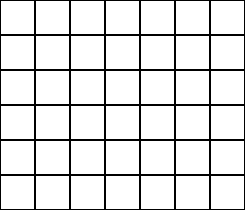
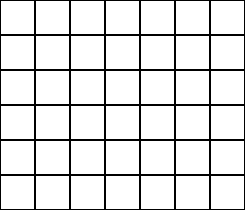

In [27]:
state = game.initial
net.propagate_to_features("main_input", nnplayer.state2inputs(state))

Now we make a move to (1,1). But note that after the move, it is now the other player's move. So the first move is seen on the opponent's board (the right side, feature #1):

Feature 0,Feature 1

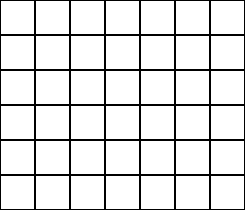
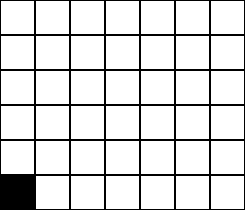

In [28]:
state = game.result(state, (1,1))
net.propagate_to_features("main_input", nnplayer.state2inputs(state))

Now, the second player moves to (2,1). Now we are back to the original perspective, and so the right-hand board is on the left, because that is now the current player's perspective.

Feature 0,Feature 1

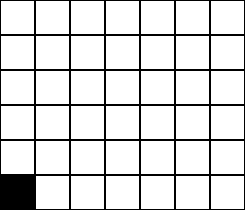
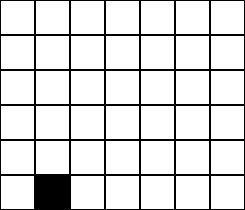

In [29]:
state = game.result(state, (2,1))
net.propagate_to_features("main_input", nnplayer.state2inputs(state))

Finally, we are ready to connect the game to the network. We define a function `get_predictions` that takes a game and state, and propagates it through the network returning a (value, probabilities, allowedActions). The probabilities are the pi list from the AlphaZero paper.

In [30]:
value, probs, acts = nnplayer.get_predictions(state)


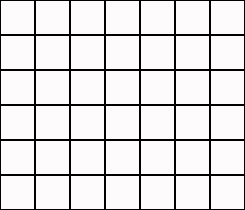
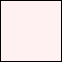
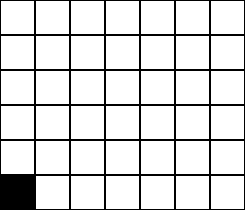

In [31]:
net.picture(nnplayer.state2inputs(state))

In [32]:
dash = net.dashboard()
dash

Dashboard(children=(Accordion(children=(HBox(children=(VBox(children=(Select(description='Dataset:', index=1, options=('Test', 'Train'), rows=1, value='Train'), FloatSlider(value=0.9, continuous_update=False, description='Zoom', layout=Layout(width='65%'), max=1.0, style=SliderStyle(description_width='initial')), IntText(value=400, description='Horizontal space between banks:', style=DescriptionStyle(description_width='initial')), IntText(value=30, description='Vertical space between layers:', style=DescriptionStyle(description_width='initial')), HBox(children=(Checkbox(value=True, description='Show Targets', style=DescriptionStyle(description_width='initial')), Checkbox(value=False, description='Errors', style=DescriptionStyle(description_width='initial')))), Select(description='Features:', options=('', 'main_input', 'conv2d-1', 'batch-norm-1', 'leaky-relu-1', 'conv2d-2', 'batch-norm-2', 'leaky-relu-2', 'conv2d-3', 'batch-norm-3', 'add-1', 'leaky-relu-3', 'conv2d-4', 'batch-norm-4', 'leaky-relu-4', 'conv2d-5', 'batch-norm-5', 'add-2', 'leaky-relu-5', 'conv2d-6', 'batch-norm-6', 'leaky-relu-6', 'conv2d-7', 'batch-norm-7', 'add-3', 'leaky-relu-7', 'conv2d-8', 'batch-norm-8', 'leaky-relu-8', 'conv2d-9', 'batch-norm-9', 'add-4', 'leaky-relu-9', 'conv2d-10', 'batch-norm-10', 'leaky-relu-10', 'conv2d-11', 'batch-norm-11', 'add-5', 'leaky-relu-11', 'conv2d-12', 'batch-norm-12', 'leaky-relu-12', 'conv2d-13', 'batch-norm-13', 'leaky-relu-13'), rows=1, value=''), IntText(value=3, description='Feature columns:', style=DescriptionStyle(description_width='initial')), FloatText(value=1.0, description='Feature scale:', style=DescriptionStyle(description_width='initial'))), layout=Layout(width='100%')), VBox(children=(Select(description='Layer:', index=50, options=('main_input', 'conv2d-1', 'batch-norm-1', 'leaky-relu-1', 'conv2d-2', 'batch-norm-2', 'leaky-relu-2', 'conv2d-3', 'batch-norm-3', 'add-1', 'leaky-relu-3', 'conv2d-4', 'batch-norm-4', 'leaky-relu-4', 'conv2d-5', 'batch-norm-5', 'add-2', 'leaky-relu-5', 'conv2d-6', 'batch-norm-6', 'leaky-relu-6', 'conv2d-7', 'batch-norm-7', 'add-3', 'leaky-relu-7', 'conv2d-8', 'batch-norm-8', 'leaky-relu-8', 'conv2d-9', 'batch-norm-9', 'add-4', 'leaky-relu-9', 'conv2d-10', 'batch-norm-10', 'leaky-relu-10', 'conv2d-11', 'batch-norm-11', 'add-5', 'leaky-relu-11', 'conv2d-12', 'batch-norm-12', 'leaky-relu-12', 'flatten-1', 'policy_head', 'conv2d-13', 'batch-norm-13', 'leaky-relu-13', 'flatten-2', 'dense-1', 'leaky-relu-14', 'value_head'), rows=1, value='value_head'), Checkbox(value=True, description='Visible'), Select(description='Colormap:', options=('', 'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Vega10', 'Vega10_r', 'Vega20', 'Vega20_r', 'Vega20b', 'Vega20b_r', 'Vega20c', 'Vega20c_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r',

In [33]:
net.dataset.append(nnplayer.state2inputs(state), 
                   [[random.random() for i in range(42)], [1]])

In [34]:
output = dash.propagate(nnplayer.state2inputs(state))

## Testing Game and Network Integration

Finally, we turn the predictions into a move, and we can play a game with the network.

In [35]:
p1 = RandomPlayer()
p2 = NNPlayer("NNPlayer-2", make_network(game, netconfig))

In [36]:
p2.set_game(game)

In [37]:
p2.get_action(state, 2)

(1, 2)

In [38]:
game.play_game(p1, p2, verbose=0)

['RandomPlayer-4']

In [39]:
game.display(game.final_state)

. . O . . . . 
. . X . . . . 
. . X X . . . 
. . X X . . X 
O . O X . . O 
O . X X O O O 


## Training The Network

Now we are ready to train the network. The training is a clever use of Monte Carlo Tree Search.

There is a Monte Carlo Tree Search player that we will use:

In [40]:
class MCTSPlayerWithNetPolicy(MCTSPlayer):
    """
    A Monte Carlo Tree Search with policy function from
    neural network. Network will be set later to self.nnplayer.
    """
    def __init__(self, name, net, n_playout, c_puct, is_selfplay,
                 turn_to_play_deterministically,
                 *args, **kwargs):
        super().__init__(name,
                         *args,
                         n_playout=n_playout,
                         c_puct=c_puct,
                         is_selfplay=is_selfplay,
                         **kwargs)
        self.net = net
        self.turn_to_play_deterministically = turn_to_play_deterministically
        self.memory = []

    def set_game(self, game):
        super().set_game(game)
        self.nnplayer = NNPlayer(self.name + "-NNPlayer", self.net)
        self.nnplayer.set_game(game)

    def get_action(self, state, turn, *args, **kwargs):
        if turn >= self.turn_to_play_deterministically:
            self.temp = 1e-3
        else:
            self.temp = 0.1
        move, pi = super().get_action(state, turn, *args, return_prob=True, **kwargs)
        self.memory.append((self.nnplayer.state2inputs(state),
                            self.move_probs2all_probs(pi)))
        return move

    def move_probs2all_probs(self, move_probs):
        all_probs = np.zeros(len(self.nnplayer.state2array(game.initial)))
        for move in move_probs:
            all_probs[self.nnplayer.move2pos[move]] = move_probs[move]
        return all_probs.tolist()

    def policy(self, game, state):
        # these moves are positions:
        value, probs_all, moves = self.nnplayer.get_predictions(state)
        if len(moves) == 0:
            result = [], value
        else:
            probs = np.array(probs_all)[moves]
            moves = [self.nnplayer.pos2move[pos] for pos in moves]
            # we need to return probs and moves for game
            result = [(act, prob) for (act, prob) in list(zip(moves, probs))], value
        return result

In [41]:
class SelfPlayGame(ConnectFour):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.memory = []

    def play_game(self, *players, **kwargs):
        results = super().play_game(*players, **kwargs)
        value = self.final_utility
        for player in players:
            if hasattr(player, "memory"):
                for state, probs in player.memory:
                    self.memory.append([state, [probs, [value]]])
                player.memory[:] = []
        return results

    def play_tournament(self, *players, **kwargs):
        self.memory = []
        return super().play_tournament(*players, **kwargs)

In [42]:
def train(config):
    """
    The AlphaZero training method.
    """
    global memory
    for cycle in range(config.CYCLES):
        print("Cycle #%s..." % cycle)
        ########################################################
        # Phase 1: self-play, collect data
        ########################################################
        print("Self-play matches begin...")
        best_player1 = MCTSPlayerWithNetPolicy(
            "Best Player 1",
            best_net,
            config.N_PLAYOUT,
            config.C_PUCT,
            is_selfplay=True,
            turn_to_play_deterministically=config.TURN_TO_PLAY_DETERMINISTICALLY)
        best_player2 = MCTSPlayerWithNetPolicy(
            "Best Player 2",
            best_net,
            config.N_PLAYOUT,
            config.C_PUCT,
            is_selfplay=True,
            turn_to_play_deterministically=config.TURN_TO_PLAY_DETERMINISTICALLY)
        results = self_play_game.play_tournament(config.SELF_PLAY_MATCHES,
                                                 best_player1, best_player2)
        memory.extend(self_play_game.memory)
        ## Keep resonable size
        memory = memory[-config.MAX_MEMORY_SIZE:]
        print("Memory size is %s" % len(memory))
        if len(memory) >= config.MEMORY_SIZE:
            ########################################################
            # Phase 2: Train the current player with data collected:
            ########################################################
            print("Enough to train!")
            current_net.dataset.load(memory)
            current_net.train(config.TRAINING_EPOCHS_PER_CYCLE,
                                     batch_size=config.BATCH_SIZE, plot=False)
            ########################################################
            # Phase 3: Play current_player vs. best_player
            ########################################################
            ## If current is better thn best, move the current weights to best
            best_player = MCTSPlayerWithNetPolicy(
                "Best Player",
                best_net,
                config.N_PLAYOUT,
                config.C_PUCT,
                is_selfplay=False,
                turn_to_play_deterministically=1)
            current_player = MCTSPlayerWithNetPolicy(
                "Current Player",
                current_net,
                config.N_PLAYOUT,
                config.C_PUCT,
                is_selfplay=False,
                turn_to_play_deterministically=1)
            results = game.play_tournament(config.TOURNAMENT_MATCHES,
                                           best_player, current_player)
            print("Tournament results:", results)
            if results["Current Player"] > results["Best Player"] * config.BEST_SWAP_PERCENT:
                print("Current player won! swapping weights...")
                # copy the better weights to the best_player
                wts = current_net.get_weights()
                best_net.model.set_weights(wts)
                best_net.save_weights("BestWeights-%s.conx" % cycle)
            else:
                print("Best player remains best.")

In [43]:
Config = namedtuple("Config", [
    "CYCLES",
    "MEMORY_SIZE",
    "MAX_MEMORY_SIZE",
    "TRAINING_EPOCHS_PER_CYCLE",
    "BATCH_SIZE",
    "LEARNING_RATE",
    "MOMENTUM",
    "SELF_PLAY_MATCHES",
    "TURN_TO_PLAY_DETERMINISTICALLY",
    "C_PUCT",
    "TOURNAMENT_MATCHES",
    "BEST_SWAP_PERCENT",
    "N_PLAYOUT",
])

In [44]:
config = Config(
    CYCLES=10, # number of cycles to run
    MEMORY_SIZE=1000, # min size of memory
    MAX_MEMORY_SIZE=30000, # min size of memory
    TRAINING_EPOCHS_PER_CYCLE=1, # training on current network
    BATCH_SIZE=256, # batch_size for NN training
    LEARNING_RATE=0.1, # SGD Learning rate
    MOMENTUM=0.9, # SGD Momentum
    SELF_PLAY_MATCHES=25, # matches to test yo' self per self-play round
    TURN_TO_PLAY_DETERMINISTICALLY=10, # for selfplay mode
    C_PUCT=1.0, # rely on priors (0, +Infinity]
    TOURNAMENT_MATCHES=20, # plays each player as first mover per match, so * 2
    BEST_SWAP_PERCENT=1.3, # you must be this much better than best
    N_PLAYOUT=50, # number of MCTS simulations
)

In [45]:
self_play_game = SelfPlayGame(notebook=True)
game = ConnectFour(notebook=True)
memory = []
## The nets:
best_net = make_network(self_play_game, config)
current_net = make_network(self_play_game, config)

In [46]:
train(config)

Cycle #0...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))

Memory size is 916
Cycle #1...
Self-play matches begin...


HBox(children=(IntProgress(value=0, max=50), HTML(value='')))

Memory size is 1961
Enough to train!
Evaluating initial training metrics...
Training...
       |  Training |    policy |     value 
Epochs |     Error |  head acc |  head acc 
------ | --------- | --------- | --------- 
#    0 |   1.42127 |   0.00000 |   0.00000 
#    1 |   1.47321 |   0.00000 |   0.01836 
#    1 |   1.47321 |   0.00000 |   0.01836 


HBox(children=(IntProgress(value=0, max=40), HTML(value='')))

KeyboardInterrupt: 

In [47]:
new_game = ConnectFour(notebook=True)

random_player = RandomPlayer("Rando")
best_player = MCTSPlayerWithNetPolicy(
    "Best Player",
    best_net,
    config.N_PLAYOUT,
    config.C_PUCT,
    is_selfplay=False,
    turn_to_play_deterministically=1)


In [49]:
new_game.play_tournament(10, best_player, random_player)

HBox(children=(IntProgress(value=0, max=20), HTML(value='')))

{'Best Player': 19, 'DRAW': 0, 'Rando': 1}

## Summary

* Play against itself, at just the right level. Evolution-style.
* Uses search in training.